# Project Summary: Fraud Detection with GANs

## Objective
The goal of this project was to create a Generative Adversarial Network (GAN) to generate synthetic fraud data and evaluate its similarity to real fraud data. The project helps to address the class imbalance in fraud detection datasets and improve model robustness.


## Key Steps

### 1. Data Preparation
- **Dataset**: A credit card transaction dataset with 31 columns (including `Time`, `Amount`, and `Class`).
- **Preprocessing**:
  - Removed NaN values.
  - Dropped irrelevant columns (e.g., `Time`).
  - Standardized the `Amount` column using `StandardScaler`.
  - Split the dataset into `fraud` (minority class) and `genuine` (majority class).

### 2. Data Exploration
- Performed PCA to reduce the dataset to 2 components for visualization.
- Verified class distribution and feature scaling before proceeding.

### 3. Model Development
#### **Generator**
- Created a neural network to generate synthetic data with 29 features.
- Used `ReLU` activation and batch normalization for stability.

#### **Discriminator**
- Built a binary classifier to distinguish real data from fake data.
- Used `ReLU` in hidden layers and `sigmoid` in the output layer with binary cross-entropy loss.

#### **GAN**
- Combined the generator and discriminator.
- Trained the GAN with adversarial learning:
  - Alternated between training the discriminator on real and fake data.
  - Optimized the generator to create data that can fool the discriminator.

### 4. Monitoring Performance
- Generated synthetic fraud data using the trained generator.
- Compared the real and synthetic data distributions through PCA and feature-wise histograms.



## Results
- **Generator Performance**:
  - The generator was able to produce synthetic fraud data resembling real fraud data.
  - However, some features exhibited mode collapse, where the generated data was overly concentrated.

- **Visualization**:
  - PCA scatter plots and histograms highlighted the similarities and differences in distributions between real and synthetic data.



## Conclusion
The project demonstrates the potential of GANs in generating synthetic fraud data to address class imbalance in fraud detection tasks. While the generator performed well on certain features, further optimization is needed to reduce mode collapse and improve the diversity of generated data.



### Task 1 - Importing the Dataset

In [1]:
import numpy as np
import pandas as pd

# Importing neural network modules
import tensorflow as tf
from tensorflow.keras.layers import Input, Dense, BatchNormalization, LeakyReLU, Dropout
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.initializers import RandomNormal
# Importing some machine learning modules
from sklearn.utils import shuffle
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
# Import data visualization modules
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

print("Modules are imported!")

2024-12-10 15:49:31.857274: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


Modules are imported!


In [2]:
data = pd.read_csv("Creditcard_dataset.csv")
data.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,1,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
1,7,-0.644269,1.417964,1.074380,-0.492199,0.948934,0.428118,1.120631,-3.807864,0.615375,...,1.943465,-1.015455,0.057504,-0.649709,-0.415267,-0.051634,-1.206921,-1.085339,40.80,0
2,10,1.449044,-1.176339,0.913860,-1.375667,-1.971383,-0.629152,-1.423236,0.048456,-1.720408,...,-0.009302,0.313894,0.027740,0.500512,0.251367,-0.129478,0.042850,0.016253,7.80,0
3,10,0.384978,0.616109,-0.874300,-0.094019,2.924584,3.317027,0.470455,0.538247,-0.558895,...,0.049924,0.238422,0.009130,0.996710,-0.767315,-0.492208,0.042472,-0.054337,9.99,0
4,11,1.069374,0.287722,0.828613,2.712520,-0.178398,0.337544,-0.096717,0.115982,-0.221083,...,-0.036876,0.074412,-0.071407,0.104744,0.548265,0.104094,0.021491,0.021293,27.50,0


Check the data shape

In [3]:
data.shape

(50492, 31)

Let's see how many genuine and limited fraudulent records we have

In [4]:
data.Class.value_counts()

0    50000
1      492
Name: Class, dtype: int64

### Task 2 - Data Preprocessing and Exploration

*   Removing all the rows with `Nan` values
*   Removing `Time` column
*   Feature Scaling `Amount` column
*   Split the data into features and labels
*   Data Exploration


Removing the rows `Nan` values in the dataset

In [5]:
data.dropna(inplace=True)
data.shape

(50492, 31)

Removing Time column

In [6]:
# What you want to delete is the column
data = data.drop(axis =1, columns = 'Time')
data.head()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,-0.054952,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
1,-0.644269,1.417964,1.074380,-0.492199,0.948934,0.428118,1.120631,-3.807864,0.615375,1.249376,...,1.943465,-1.015455,0.057504,-0.649709,-0.415267,-0.051634,-1.206921,-1.085339,40.80,0
2,1.449044,-1.176339,0.913860,-1.375667,-1.971383,-0.629152,-1.423236,0.048456,-1.720408,1.626659,...,-0.009302,0.313894,0.027740,0.500512,0.251367,-0.129478,0.042850,0.016253,7.80,0
3,0.384978,0.616109,-0.874300,-0.094019,2.924584,3.317027,0.470455,0.538247,-0.558895,0.309755,...,0.049924,0.238422,0.009130,0.996710,-0.767315,-0.492208,0.042472,-0.054337,9.99,0
4,1.069374,0.287722,0.828613,2.712520,-0.178398,0.337544,-0.096717,0.115982,-0.221083,0.460230,...,-0.036876,0.074412,-0.071407,0.104744,0.548265,0.104094,0.021491,0.021293,27.50,0


Feature Scaling of Amount column. StandardScaler was used to standardize the `Amount` column. This process adjusts the values so that the column has a mean of 0 and a standard deviation of 1. Scaling is necessary to prevent features with larger ranges from dominating the model.

In [7]:
# Features are scaled according to the standard normal distribution
scaler = StandardScaler()
data['Amount'] = scaler.fit_transform(data[['Amount']])
data.head()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,-0.054952,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,0.150105,0
1,-0.644269,1.417964,1.074380,-0.492199,0.948934,0.428118,1.120631,-3.807864,0.615375,1.249376,...,1.943465,-1.015455,0.057504,-0.649709,-0.415267,-0.051634,-1.206921,-1.085339,-0.199848,0
2,1.449044,-1.176339,0.913860,-1.375667,-1.971383,-0.629152,-1.423236,0.048456,-1.720408,1.626659,...,-0.009302,0.313894,0.027740,0.500512,0.251367,-0.129478,0.042850,0.016253,-0.339490,0
3,0.384978,0.616109,-0.874300,-0.094019,2.924584,3.317027,0.470455,0.538247,-0.558895,0.309755,...,0.049924,0.238422,0.009130,0.996710,-0.767315,-0.492208,0.042472,-0.054337,-0.330223,0
4,1.069374,0.287722,0.828613,2.712520,-0.178398,0.337544,-0.096717,0.115982,-0.221083,0.460230,...,-0.036876,0.074412,-0.071407,0.104744,0.548265,0.104094,0.021491,0.021293,-0.256128,0


Let's split the genuine and fraud records into separate dataframes

In [8]:
data_fraud = data[data.Class == 1]
data_genuine = data[data.Class == 0]
data_fraud.shape

(492, 30)

In [9]:
data_genuine.shape

(50000, 30)

Split the data into features and labels

In [10]:
X = data.drop("Class",axis = 1)
y = data.Class

In [11]:
X

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount
0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,-0.054952,...,-0.208038,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,0.150105
1,-0.644269,1.417964,1.074380,-0.492199,0.948934,0.428118,1.120631,-3.807864,0.615375,1.249376,...,-0.156742,1.943465,-1.015455,0.057504,-0.649709,-0.415267,-0.051634,-1.206921,-1.085339,-0.199848
2,1.449044,-1.176339,0.913860,-1.375667,-1.971383,-0.629152,-1.423236,0.048456,-1.720408,1.626659,...,-0.387226,-0.009302,0.313894,0.027740,0.500512,0.251367,-0.129478,0.042850,0.016253,-0.339490
3,0.384978,0.616109,-0.874300,-0.094019,2.924584,3.317027,0.470455,0.538247,-0.558895,0.309755,...,0.125992,0.049924,0.238422,0.009130,0.996710,-0.767315,-0.492208,0.042472,-0.054337,-0.330223
4,1.069374,0.287722,0.828613,2.712520,-0.178398,0.337544,-0.096717,0.115982,-0.221083,0.460230,...,-0.153197,-0.036876,0.074412,-0.071407,0.104744,0.548265,0.104094,0.021491,0.021293,-0.256128
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50487,-1.927883,1.125653,-4.518331,1.749293,-1.566487,-2.010494,-0.882850,0.697211,-2.064945,-5.587794,...,1.252967,0.778584,-0.319189,0.639419,-0.294885,0.537503,0.788395,0.292680,0.147968,1.277825
50488,1.378559,1.289381,-5.004247,1.411850,0.442581,-1.326536,-1.413170,0.248525,-1.127396,-3.232153,...,0.226138,0.370612,0.028234,-0.145640,-0.081049,0.521875,0.739467,0.389152,0.186637,-0.369281
50489,-0.676143,1.126366,-2.213700,0.468308,-1.120541,-0.003346,-2.234739,1.210158,-0.652250,-3.463891,...,0.247968,0.751826,0.834108,0.190944,0.032070,-0.739695,0.471111,0.385107,0.194361,-0.042898
50490,-3.113832,0.585864,-5.399730,1.817092,-0.840618,-2.943548,-2.208002,1.058733,-1.632333,-5.245984,...,0.306271,0.583276,-0.269209,-0.456108,-0.183659,-0.328168,0.606116,0.884876,-0.253700,0.664244


In [12]:
X.shape

(50492, 29)

In [13]:
y.shape

(50492,)

Data Exploration

  - PCA (Principal Component Analysis) is applied to the dataset `X` to reduce the number of features while retaining the majority of the variance (i.e., the information in the data).
  - In this case, we specify `PCA(2)` to reduce the dataset to two principal components, making it suitable for visualization.


In [14]:
pca = PCA(2)
transformed_data = pca.fit_transform(X)
df = pd.DataFrame(transformed_data)
df

,0,1
0,-0.447840,1.197465
1,-0.582394,0.257993
2,-0.939389,-0.728308
3,-0.630765,-0.499116
4,-0.536288,-1.055415
...,...,...
50487,10.855753,-2.787268
50488,6.927753,-4.949637
50489,7.038192,-2.785075
50490,11.649179,-1.991653


In [15]:
df['label'] = y
df

,0,1,label
0,-0.447840,1.197465,0
1,-0.582394,0.257993,0
2,-0.939389,-0.728308,0
3,-0.630765,-0.499116,0
4,-0.536288,-1.055415,0
...,...,...,...
50487,10.855753,-2.787268,1
50488,6.927753,-4.949637,1
50489,7.038192,-2.785075,1
50490,11.649179,-1.991653,1


Let's Use a scatter plot to visualize our data.
- Horizontal axis: the first principal component. 
- Vertical axis: the second principal component. 
- Color: Groups by label, using different colors to distinguish categories.

In [16]:
px.scatter(df, x= 0, y=1,color=df.label.astype(str))

### Task 3 - Building the Generator Model

Write a method to create the Generator model architecture:
- he_uniform: A weight initialization method designed for ReLU activation functions. Helps avoid gradient disappearance or explosion problems
- Create a Dense Layer with Keras
- Rectified Linear Unit (ReLU)

### Parameter Calculation in Neural Network Layers

#### 1. Dense Layer (Fully Connected Layer)

A Dense layer has two main types of parameters:
1. **Weights**: A matrix connecting every input neuron to every output neuron.
2. **Biases**: A vector added to each output neuron.

##### Formula
The total number of parameters in a Dense layer is calculated as:
\[
\text{Total Parameters} = (\text{Number of Inputs} \times \text{Number of Outputs}) + \text{Number of Outputs}
\]

##### Example
For a Dense layer with:
- **Inputs**: 29
- **Outputs (Neurons)**: 32

The total parameters are:
\[
\text{Total Parameters} = (29 \times 32) + 32 = 928 + 32 = 960
\]



#### 2. Batch Normalization Layer

A Batch Normalization layer introduces two additional parameters for each feature:
1. **Gamma (\( \gamma \))**: A scaling parameter for each feature.
2. **Beta (\( \beta \))**: A shift parameter for each feature.

##### Formula
The total number of parameters in a Batch Normalization layer is:
\[
\text{Total Parameters} = 2 \times \text{Number of Features (Outputs)}
\]

##### Example
For a Batch Normalization layer with:
- **Features (Outputs)**: 32

The total parameters are:
\[
\text{Total Parameters} = 2 \times 32 = 64
\]



#### 3. Example: A Dense Layer Followed by Batch Normalization

##### Setup
- **Dense Layer**: Input = 29, Output = 32
- **Batch Normalization**: Output = 32

##### Total Parameters
1. **Dense Layer**:
   \[
   (29 \times 32) + 32 = 960
   \]

2. **Batch Normalization**:
   \[
   2 \times 32 = 64
   \]

**Total Parameters**:
\[
960 + 64 = 1024
\]



#### Summary
For each layer:
- **Dense Layer**: The parameters depend on the number of inputs and outputs.
- **Batch Normalization**: Each feature adds two parameters (\( \gamma \) and \( \beta \)).


In [17]:
def build_generator():
    model = Sequential()
    # The ReLU (rectifiers linear unit) serves as an activation function that helps the model capture nonlinear relationships.
    model.add(Dense(32, activation = 'relu', input_dim =29, kernel_initializer = 'he_uniform'))
    model.add(BatchNormalization())
     
    model.add(Dense(64, activation = 'relu'))
    model.add(BatchNormalization())   
    
    model.add(Dense(128, activation = 'relu'))
    model.add(BatchNormalization())
    
    model.add(Dense(29, activation = 'relu'))
    model.summary()
    
    return model

build_generator()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 32)                960       
                                                                 
 batch_normalization (BatchN  (None, 32)               128       
 ormalization)                                                   
                                                                 
 dense_1 (Dense)             (None, 64)                2112      
                                                                 
 batch_normalization_1 (Batc  (None, 64)               256       
 hNormalization)                                                 
                                                                 
 dense_2 (Dense)             (None, 128)               8320      
                                                                 
 batch_normalization_2 (Batc  (None, 128)              5

2024-12-10 15:49:58.350874: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


### Task 4 - Building the Discriminator Model

Write a method to create the Discriminator model architecture
#### Principles for Designing the Discriminator

##### Data Features
- The number of input features determines the size of the input layer.
- The complexity of the data determines the depth and width of the hidden layers.
- For complex data (e.g., images), more hidden layers and neurons are needed.
- For simpler data (e.g., tabular data), the network depth and width can be reduced.

##### Task Objectives
- The discriminator is a binary classification model.
- The output layer usually contains a single neuron.
- Sigmoid activation function and binary cross-entropy loss are commonly used.

##### Model Stability
- Use the ReLU activation function for hidden layers to improve training efficiency.
- Select optimizers suitable for deep networks (e.g., Adam) to avoid gradient vanishing or exploding issues.

##### Experimentation and Tuning
- The initial design often relies on experience from similar tasks (e.g., the number of hidden layers and neurons).
- Adjust the model structure through experimentation to find the optimal configuration.


In [18]:
def build_discriminator():
    model = Sequential()
    
    model.add(Dense(128, activation = 'relu', input_dim =29, kernel_initializer = 'he_uniform'))
     
    model.add(Dense(64, activation = 'relu'))
    model.add(Dense(32, activation = 'relu'))
    model.add(Dense(32, activation = 'relu'))
    model.add(Dense(16, activation = 'relu'))
    
    model.add(Dense(1, activation = 'sigmoid'))
    model.compile(optimizer = 'adam', loss = 'binary_crossentropy')
    model.summary()
    
    return model

build_discriminator()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_4 (Dense)             (None, 128)               3840      
                                                                 
 dense_5 (Dense)             (None, 64)                8256      
                                                                 
 dense_6 (Dense)             (None, 32)                2080      
                                                                 
 dense_7 (Dense)             (None, 32)                1056      
                                                                 
 dense_8 (Dense)             (None, 16)                528       
                                                                 
 dense_9 (Dense)             (None, 1)                 17        
                                                                 
Total params: 15,777
Trainable params: 15,777
Non-trai

### Task 5 - Combine Generator and Discriminator models to Build The GAN


#### Random Noise Generation:
- The input is a random noise vector (e.g., 100-dimensional random numbers).
- Shape: `(batch_size, 100)`.

#### Generator Creates Fake Data:
- The generator maps the random noise to fake data, producing outputs with the same shape as the real data.
- For example, the output shape is `(batch_size, 29)`.

#### Discriminator Evaluates Fake Data:
- The discriminator receives the fake data and outputs a probability indicating whether the fake data is "real."
- Output shape: `(batch_size, 1)`.


In [19]:
def build_gan(generator, discriminator):
    # Why: When training the entire GAN model, our goal is to improve the performance of the generator so that the data it generates can fool the discriminator.
    # Freezing the parameters of the discriminator ensures that when GAN is trained, only the generator's parameters are updated and the discriminator remains unchanged.
    discriminator.trainable = False
    gan_input = Input(shape = (generator.input_shape[1],))
    # Sample data generated by the generator.
    x = generator(gan_input)
    
    # The input to the discriminator is a sample generated by the generator, not direct real data. We want to train the generator to fool the discriminator into thinking that the generated data is real.
    gan_output = discriminator(x)
    gan = Model(gan_input,gan_output)
    gan.summary()
    return gan

Generates fake data samples using the generator model in a GAN.

### Process
1. **Random Noise Generation**:
   - Creates noise vectors sampled from a normal distribution (\( \mathcal{N}(0, 1) \)).
   - Shape: `(num_samples, generator.input_shape[1])`.

2. **Fake Data Generation**:
   - Feeds noise vectors into the generator to produce fake data.
   - Output shape matches the generator's output, e.g., `(num_samples, 29)`.


In [20]:
def generate_synthetic_data(generator, num_samples):
    noise = np.random.normal(0,1,(num_samples, generator.input_shape[1]))
    fake_data = generator.predict(noise)
    return fake_data

### Task 6 - Train and evaluate our GAN
*    Defining some variables
*    Creating our GAN
*    Training the GAN
*    Monitor the GAN performance using PCA

#### Function: `monitor_generator`

##### Purpose
Visualizes the performance of the generator in generating synthetic data by comparing it with real data in a reduced dimensional space using PCA.

##### Steps
1. **PCA Transformation**:
   - Reduces both real and synthetic data to 2 principal components for visualization.

2. **Process Real Data**:
   - Drops the "Class" column and applies PCA to transform the real fraud data.
   - Adds a label "real" for identification.

3. **Generate and Process Synthetic Data**:
   - Uses the generator to create synthetic fraud data.
   - Applies PCA to transform the synthetic data.
   - Adds a label "fake" for identification.

4. **Combine Data**:
   - Concatenates the transformed real and fake data into a single DataFrame.

5. **Visualization**:
   - Creates a scatter plot to compare real and fake data points in the PCA-reduced 2D space.
   - Differentiates data points by color using the "label" column.

##### Output
A scatter plot showing the distribution of real and synthetic data for performance monitoring of the generator.



In [21]:
def monitor_generator(generator):
    # Initialize a PCA (Principal Component Analysis) object with 2 components
    pca = PCA(n_components=2)

    # Drop the 'Class' column from the fraud dataset to get real data
    real_fraud_data = data_fraud.drop("Class", axis=1)

    # Transform the real fraud data using PCA
    transformed_data_real = pca.fit_transform(real_fraud_data.values)

    # Create a DataFrame for the transformed real data and add a 'label' column with the value 'real'
    df_real = pd.DataFrame(transformed_data_real)
    df_real['label'] = "real"

    
    
    # Generate synthetic fraud data using the provided generator and specify the number of samples (492 in this case)
    synthetic_fraud_data = generate_synthetic_data(generator, 492)

    # Transform the synthetic fraud data using PCA
    transformed_data_fake = pca.fit_transform(synthetic_fraud_data)

    # Create a DataFrame for the transformed fake data and add a 'label' column with the value 'fake'
    df_fake = pd.DataFrame(transformed_data_fake)
    df_fake['label'] = "fake"

    # Concatenate the real and fake data DataFrames
    df_combined = pd.concat([df_real, df_fake])

    # Create a scatterplot to visualize the data points, using the first and second PCA components as x and y, respectively,
    # and color points based on the 'label' column, with a size of 10
    plt.figure()
    sns.scatterplot(data=df_combined, x=0, y=1, hue='label', s=10)
    plt.show()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_10 (Dense)            (None, 32)                960       
                                                                 
 batch_normalization_3 (Batc  (None, 32)               128       
 hNormalization)                                                 
                                                                 
 dense_11 (Dense)            (None, 64)                2112      
                                                                 
 batch_normalization_4 (Batc  (None, 64)               256       
 hNormalization)                                                 
                                                                 
 dense_12 (Dense)            (None, 128)               8320      
                                                                 
 batch_normalization_5 (Batc  (None, 128)             

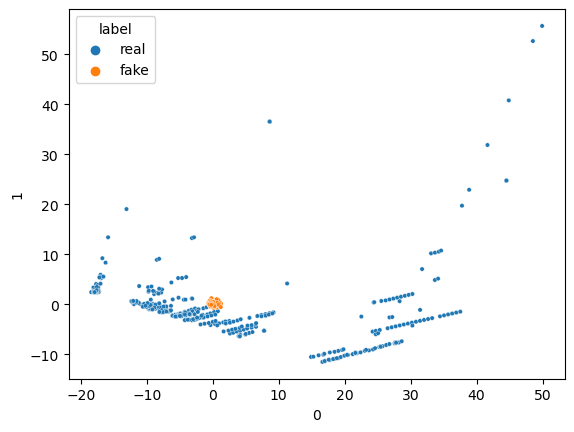

16/16 [==============================] - 0s 6ms/step


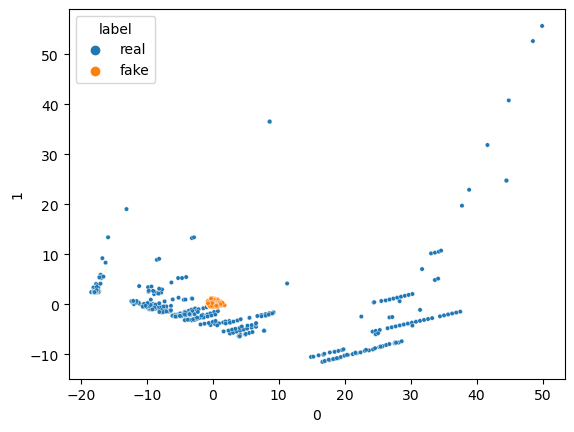

16/16 [==============================] - 0s 858us/step


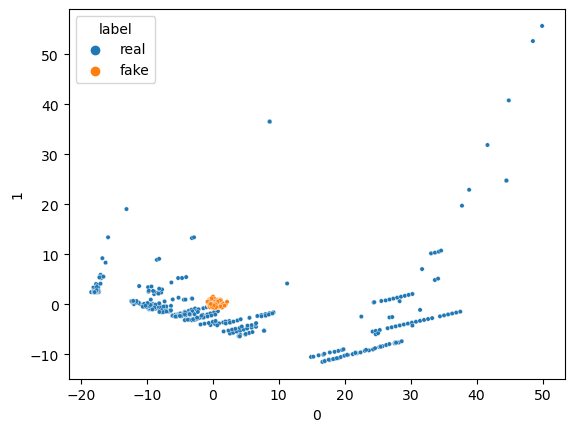

16/16 [==============================] - 0s 844us/step


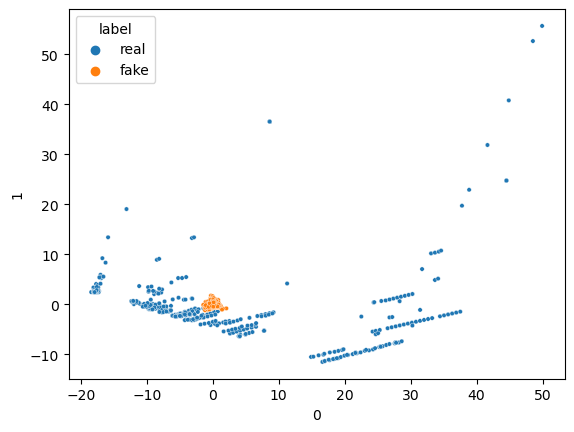

16/16 [==============================] - 0s 1ms/step


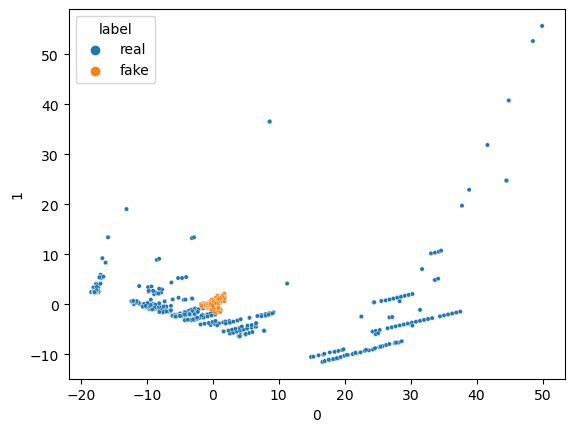

16/16 [==============================] - 0s 6ms/step


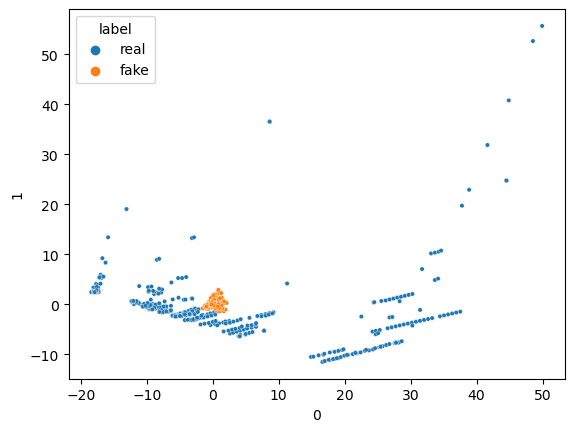

16/16 [==============================] - 0s 6ms/step


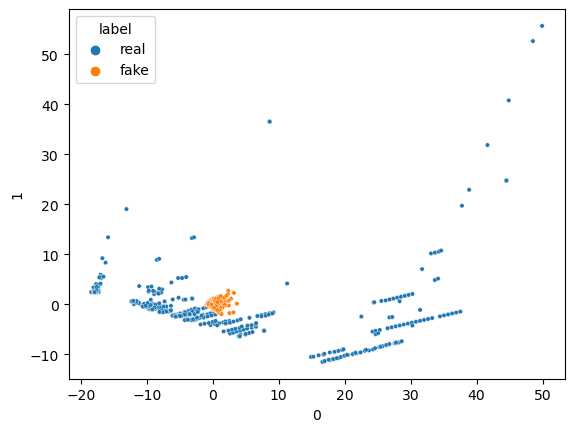

16/16 [==============================] - 0s 813us/step


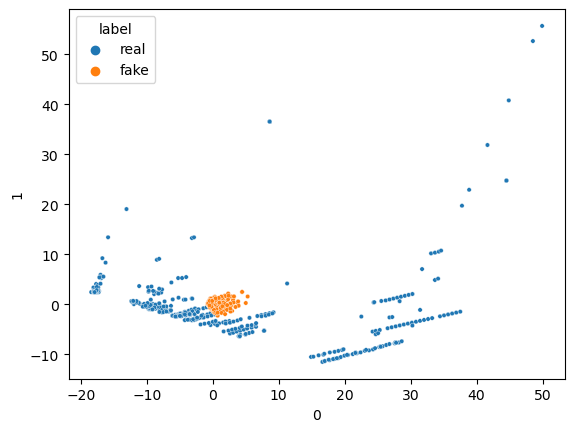

16/16 [==============================] - 0s 846us/step


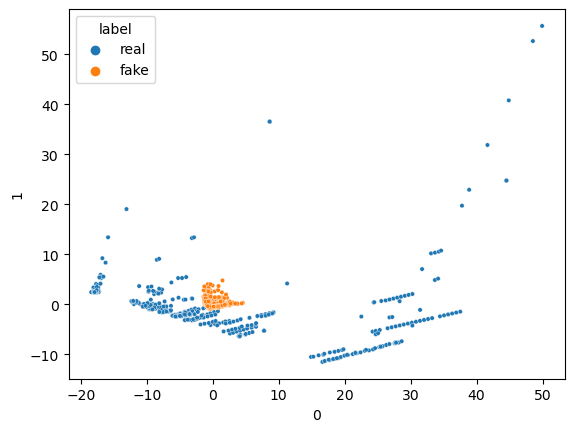

16/16 [==============================] - 0s 874us/step


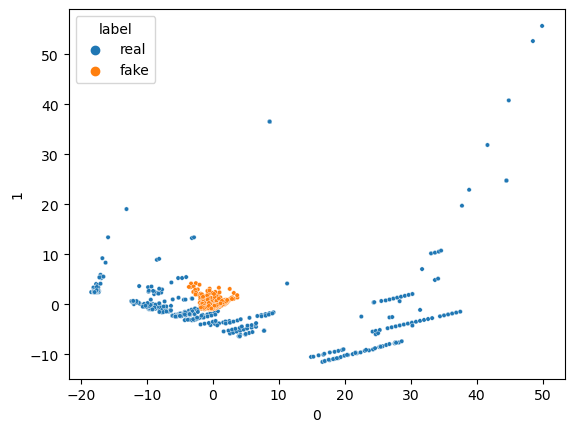

1/1 [==============================] - 0s 20ms/step


In [22]:
# Model Initialization
generator = build_generator()
discriminator = build_discriminator()
gan = build_gan(generator, discriminator)
gan.compile(optimizer = 'adam', loss= 'binary_crossentropy')

# Training Configuration
num_epochs = 100
batch_size = 32
half_batch = int(batch_size/2)

for epoch in range(num_epochs):
    # Generate Fake Data
    X_fake = generate_synthetic_data(generator, half_batch)
    y_fake = np.zeros((half_batch,1))
    # Sample Real Data
    X_real = data_fraud.drop("Class", axis=1).sample(half_batch)
    y_real = np.ones((half_batch,1))
    # Train the Discriminator
    discriminator.trainable = True
    discriminator.train_on_batch(X_real, y_real)
    discriminator.train_on_batch(X_fake, y_fake)
    # Train the Generator: Labels for the generator's output are set to 1    
    noise = np.random.normal(0,1,(batch_size,29))
    gan.train_on_batch(noise,np.ones((batch_size,1)))
    
    if epoch%10 ==0:
        monitor_generator(generator)

### Task 7 - Generate synthetic data using the trained Generator

*   Generate 1000 fradulent data points using the trained generator
*   Compare the distribution of `real` and `synthetic` fradulent data points.


In [23]:
synthetic_data = generate_synthetic_data(generator,1000)
df = pd.DataFrame(synthetic_data)
df['label'] = 'fake'

df2 = data_fraud.drop('Class', axis = 1)
df2['label'] = 'real'
df2.columns = df.columns

combined_df = pd.concat([df,df2])
combined_df

32/32 [==============================] - 0s 932us/step


,0,1,2,3,4,5,6,7,8,9,...,20,21,22,23,24,25,26,27,28,label
0,0.000000,0.000000,0.000000,2.171587,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.158067,fake
1,0.123184,0.156638,0.000000,0.000000,0.000000,0.063297,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.213097,0.000000,0.000000,0.930519,0.000000,0.000000,0.000000,fake
2,0.000000,0.000000,0.564303,0.000000,0.000000,0.000000,0.000000,0.000000,0.235628,0.000000,...,0.000000,0.351768,0.388930,0.000000,0.337063,3.426895,0.000000,0.000000,0.000000,fake
3,0.105346,0.005021,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.683177,0.000000,0.054747,0.000000,0.000000,0.000000,0.000000,fake
4,0.000000,0.000000,0.000000,1.847456,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.169312,0.636752,0.580445,0.000000,0.000000,0.000000,0.000000,0.000000,fake
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50487,-1.927883,1.125653,-4.518331,1.749293,-1.566487,-2.010494,-0.882850,0.697211,-2.064945,-5.587794,...,0.778584,-0.319189,0.639419,-0.294885,0.537503,0.788395,0.292680,0.147968,1.277825,real
50488,1.378559,1.289381,-5.004247,1.411850,0.442581,-1.326536,-1.413170,0.248525,-1.127396,-3.232153,...,0.370612,0.028234,-0.145640,-0.081049,0.521875,0.739467,0.389152,0.186637,-0.369281,real
50489,-0.676143,1.126366,-2.213700,0.468308,-1.120541,-0.003346,-2.234739,1.210158,-0.652250,-3.463891,...,0.751826,0.834108,0.190944,0.032070,-0.739695,0.471111,0.385107,0.194361,-0.042898,real
50490,-3.113832,0.585864,-5.399730,1.817092,-0.840618,-2.943548,-2.208002,1.058733,-1.632333,-5.245984,...,0.583276,-0.269209,-0.456108,-0.183659,-0.328168,0.606116,0.884876,-0.253700,0.664244,real


Checking the individual feature distribution of `synthetic` and `real` fraud data.

In [24]:
for col in combined_df.columns:
  plt.figure()
  fig = px.histogram(combined_df, color = 'label', x=col,barmode="overlay", title = f'Feature {col}', width = 640, height = 500)
  fig.show()

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>